In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.offline import iplot, init_notebook_mode

In [2]:
from warnings import filterwarnings
filterwarnings('ignore')

In [3]:
df=pd.read_csv('air quality data.csv')
df

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,Ahmedabad,2015-01-01,NaN,NaN,0.92,18.22,17.15,NaN,0.92,27.64,133.36,0.00,0.02,0.00,NaN,NaN
1,Ahmedabad,2015-01-02,NaN,NaN,0.97,15.69,16.46,NaN,0.97,24.55,34.06,3.68,5.50,3.77,NaN,NaN
2,Ahmedabad,2015-01-03,NaN,NaN,17.40,19.30,29.70,NaN,17.40,29.07,30.70,6.80,16.40,2.25,NaN,NaN
3,Ahmedabad,2015-01-04,NaN,NaN,1.70,18.48,17.97,NaN,1.70,18.59,36.08,4.43,10.14,1.00,NaN,NaN
4,Ahmedabad,2015-01-05,NaN,NaN,22.10,21.42,37.76,NaN,22.10,39.33,39.31,7.01,18.89,2.78,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29526,Visakhapatnam,2020-06-27,15.02,50.94,7.68,25.06,19.54,12.47,0.47,8.55,23.30,2.24,12.07,0.73,41.0,Good
29527,Visakhapatnam,2020-06-28,24.38,74.09,3.42,26.06,16.53,11.99,0.52,12.72,30.14,0.74,2.21,0.38,70.0,Satisfactory
29528,Visakhapatnam,2020-06-29,22.91,65.73,3.45,29.53,18.33,10.71,0.48,8.42,30.96,0.01,0.01,0.00,68.0,Satisfactory
29529,Visakhapatnam,2020-06-30,16.64,49.97,4.05,29.26,18.80,10.03,0.52,9.84,28.30,0.00,0.00,0.00,54.0,Satisfactory


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29531 entries, 0 to 29530
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   City        29531 non-null  object 
 1   Date        29531 non-null  object 
 2   PM2.5       24933 non-null  float64
 3   PM10        18391 non-null  float64
 4   NO          25949 non-null  float64
 5   NO2         25946 non-null  float64
 6   NOx         25346 non-null  float64
 7   NH3         19203 non-null  float64
 8   CO          27472 non-null  float64
 9   SO2         25677 non-null  float64
 10  O3          25509 non-null  float64
 11  Benzene     23908 non-null  float64
 12  Toluene     21490 non-null  float64
 13  Xylene      11422 non-null  float64
 14  AQI         24850 non-null  float64
 15  AQI_Bucket  24850 non-null  object 
dtypes: float64(13), object(3)
memory usage: 3.6+ MB


In [5]:
df.isnull().sum()

City              0
Date              0
PM2.5          4598
PM10          11140
NO             3582
NO2            3585
NOx            4185
NH3           10328
CO             2059
SO2            3854
O3             4022
Benzene        5623
Toluene        8041
Xylene        18109
AQI            4681
AQI_Bucket     4681
dtype: int64

### Percentage of missing values in each columns

In [6]:
null_values_count = df.isnull().sum()
total_rows = df.shape[0]
percentage_missing = (null_values_count / total_rows) * 100

result_df = pd.DataFrame({'Column Name': percentage_missing.index,'Percentage Missing': percentage_missing.values})
result_df['Percentage Missing']=result_df['Percentage Missing'].round(2)

result_df.sort_values(by='Percentage Missing', ascending=False).reset_index(drop=True)

,Column Name,Percentage Missing
0,Xylene,61.32
1,PM10,37.72
2,NH3,34.97
3,Toluene,27.23
4,Benzene,19.04
5,AQI,15.85
6,AQI_Bucket,15.85
7,PM2.5,15.57
8,NOx,14.17
9,O3,13.62


In [7]:
df.describe([0.25, 0.5 , 0.75 , 0.8 ,0.9]).T

,count,mean,std,min,25%,50%,75%,80%,90%,max
PM2.5,24933.0,67.450578,64.661449,0.04,28.820,48.57,80.5900,92.710,139.890,949.99
PM10,18391.0,118.127103,90.605110,0.01,56.255,95.68,149.7450,167.020,231.880,1000.00
NO,25949.0,17.574730,22.785846,0.02,5.630,9.89,19.9500,24.264,40.050,390.68
NO2,25946.0,28.560659,24.474746,0.01,11.750,21.69,37.6200,42.620,58.155,362.21
NOx,25346.0,32.309123,31.646011,0.00,12.820,23.52,40.1275,46.800,69.360,467.63
NH3,19203.0,23.483476,25.684275,0.01,8.580,15.85,30.0200,34.606,48.330,352.89
CO,27472.0,2.248598,6.962884,0.00,0.510,0.89,1.4500,1.670,2.630,175.81
SO2,25677.0,14.531977,18.133775,0.01,5.670,9.16,15.2200,17.790,29.680,193.86
O3,25509.0,34.491430,21.694928,0.01,18.860,30.84,45.5700,49.834,62.012,257.73
Benzene,23908.0,3.280840,15.811136,0.00,0.120,1.07,3.0800,3.830,6.090,455.03


In [8]:
df.duplicated().sum()

0

In [9]:
df.dropna(subset=['AQI'],inplace=True) # as AQI is our target column we have to make sure it contains no nul values

### EDA

In [10]:
df.shape

(24850, 16)

In [11]:
df['City'].unique()

array(['Ahmedabad', 'Aizawl', 'Amaravati', 'Amritsar', 'Bengaluru',
       'Bhopal', 'Brajrajnagar', 'Chandigarh', 'Chennai', 'Coimbatore',
       'Delhi', 'Ernakulam', 'Gurugram', 'Guwahati', 'Hyderabad',
       'Jaipur', 'Jorapokhar', 'Kochi', 'Kolkata', 'Lucknow', 'Mumbai',
       'Patna', 'Shillong', 'Talcher', 'Thiruvananthapuram',
       'Visakhapatnam'], dtype=object)

In [ ]:
fig = px.histogram(df, 
                   x='City', 
                   marginal='box', 
                   nbins=47, 
                   title='Distribution of cities')
fig.update_layout(bargap=0.1)
fig.show()

In [ ]:
fig = px.histogram(df, 
                   x='Date', 
                   marginal='box', 
                   nbins=50, 
                   color_discrete_sequence=px.colors.qualitative.Set2,
                   title='Distribution of Date')
fig.update_layout(bargap=0.1)
fig.show()

In [ ]:
fig = px.histogram(df, 
                   x='PM2.5', 
                   marginal='box', 
                   nbins=50, 
                   color_discrete_sequence=px.colors.sequential.Pinkyl_r,
                   title='Distribution of PM 2.5')
fig.update_layout(bargap=0.1)
fig.show()

In [15]:
fig = px.histogram(df, 
                   x='PM10', 
                   marginal='box', 
                   nbins=50, 
                   color='AQI_Bucket',
                   title='Distribution of PM10')
fig.update_layout(bargap=0.1)
fig.show()

In [ ]:
fig = px.histogram(df, 
                   x='CO', 
                   marginal='box',
                   nbins=30,
                   #color='AQI_Bucket',
                   color_discrete_sequence=px.colors.sequential.Plotly3_r,
                   title='Distribution of PM10')
fig.update_layout(bargap=0.1)
fig.show()

In [ ]:
fig = px.histogram(df, 
                   x='AQI', 
                   marginal='box', 
                   nbins=100,
                   color_discrete_sequence=px.colors.sequential.Tealgrn,
                   title='Distribution of AQI')
fig.update_layout(bargap=0.1)
fig.show()

In [ ]:
fig = px.histogram(df, 
                   x='Xylene', 
                   marginal='box', 
                   nbins=50,
                   color_discrete_sequence=px.colors.sequential.Viridis,
                   title='Distribution of Xylene')
fig.update_layout(bargap=0.1)
fig.show()

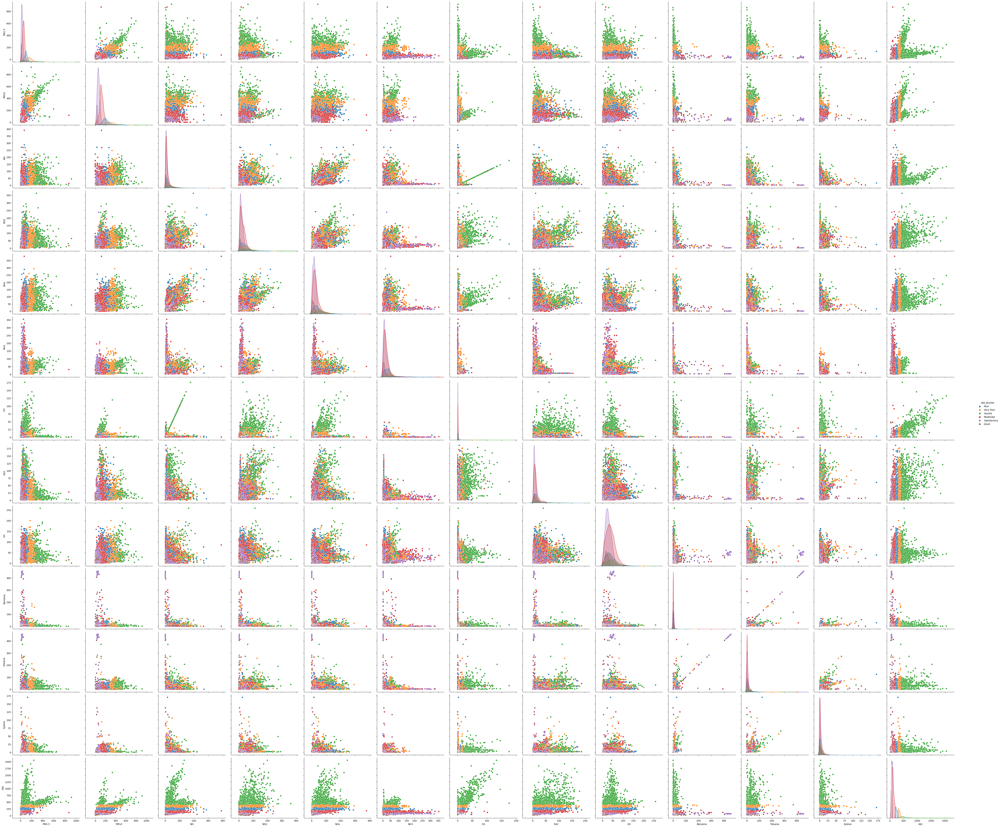

In [19]:
g = sns.pairplot(data=df, hue='AQI_Bucket', height=3)
g.fig.set_size_inches(60, 50) 
plt.show()

In [20]:
fig = px.histogram(df, 
                   x='AQI_Bucket', 
                   marginal='box', 
                   title='Distribution of AQI_Bucket')
fig.update_layout(bargap=0.1)
fig.show()

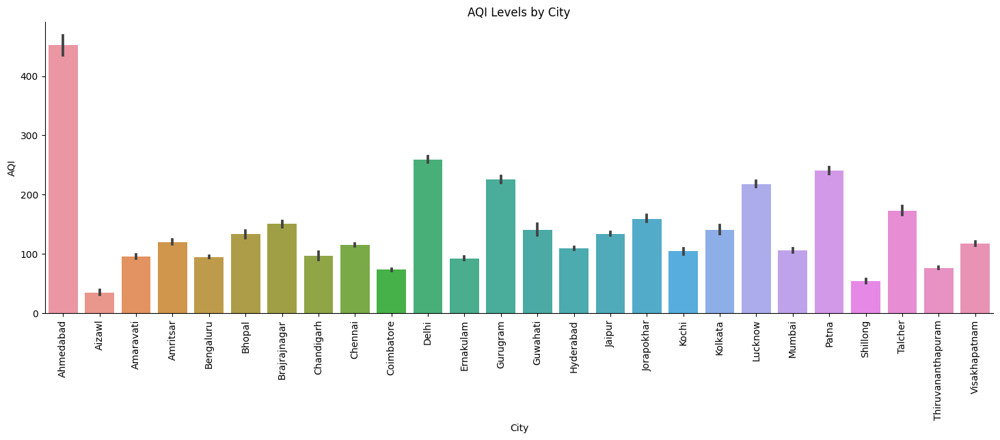

In [21]:
fig=sns.catplot(x="City",y="AQI",data=df,kind="bar",height=5,aspect=3)
fig.set_xticklabels(rotation=90)
plt.title('AQI Levels by City')
plt.xlabel('City')
plt.ylabel('AQI')
plt.show()

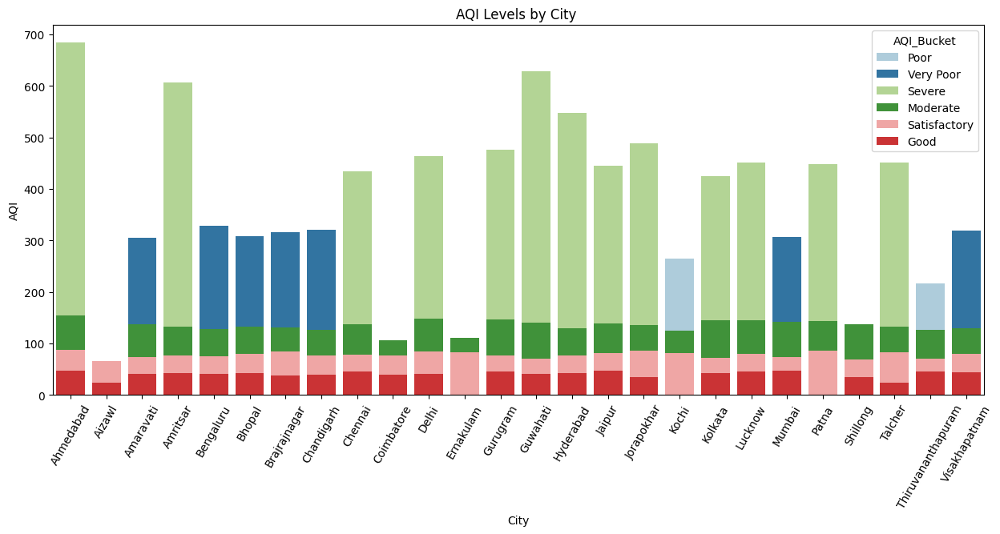

In [22]:
plt.figure(figsize=(15, 6))

sns.barplot(data=df, x='City', y='AQI', hue='AQI_Bucket', dodge=False,
           linewidth=0,
           palette='Paired',errorbar=None) 
plt.title('AQI Levels by City ')
plt.xlabel('City')
plt.ylabel('AQI')

plt.xticks(rotation=60)
plt.show()

In [23]:
fig=px.histogram(df,
                x='City',
                 y='AQI',
                 marginal='box',
                color='AQI_Bucket',
                 histfunc='avg',
                 histnorm='density',
                title='AQI levels by city')
fig.update_layout(bargap=0.1)
fig.show()

In [24]:
corr_matrix = df.corr()

In [25]:
cols=df.columns

In [26]:
df.describe()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
count,24172.000000,17764.000000,24463.000000,24459.000000,22993.000000,18314.000000,24405.000000,24245.000000,24043.000000,21315.000000,19024.000000,9478.000000,24850.000000
mean,67.476613,118.454435,17.622421,28.978391,32.289012,23.848366,2.345267,14.362933,34.912885,3.458668,9.525714,3.588683,166.463581
std,63.075398,89.487976,22.421138,24.627054,30.712855,25.875981,7.075208,17.428693,21.724525,16.036020,20.881085,6.754324,140.696585
min,0.040000,0.030000,0.030000,0.010000,0.000000,0.010000,0.000000,0.010000,0.010000,0.000000,0.000000,0.000000,13.000000
25%,29.000000,56.777500,5.660000,11.940000,13.110000,8.960000,0.590000,5.730000,19.250000,0.230000,1.027500,0.390000,81.000000
50%,48.785000,96.180000,9.910000,22.100000,23.680000,16.310000,0.930000,9.220000,31.250000,1.290000,3.575000,1.420000,118.000000
75%,80.925000,150.182500,20.030000,38.240000,40.170000,30.360000,1.480000,15.140000,46.080000,3.340000,10.180000,4.120000,208.000000
max,914.940000,917.080000,390.680000,362.210000,378.240000,352.890000,175.810000,186.080000,257.730000,455.030000,454.850000,170.370000,2049.000000


## Dealing with nul values

In [27]:
from sklearn.impute import SimpleImputer


In [28]:
numeric_cols = df.select_dtypes(include=np.number).columns.tolist()
categorical_cols = df.select_dtypes('object').columns.tolist()

In [29]:
imputer=SimpleImputer(missing_values=np.nan ,strategy='mean',)
imputer.fit(df[numeric_cols])
df[numeric_cols]=imputer.transform(df[numeric_cols])

In [30]:
df1=pd.DataFrame(df,columns=numeric_cols)
df2=df1.copy()
df3=df1.copy()
df1

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
28,83.13,118.454435,6.93,28.71,33.72,23.848366,6.93,49.52,59.76,0.020000,0.000000,3.140000,209.0
29,79.84,118.454435,13.85,28.68,41.08,23.848366,13.85,48.49,97.07,0.040000,0.000000,4.810000,328.0
30,94.52,118.454435,24.39,32.66,52.61,23.848366,24.39,67.39,111.33,0.240000,0.010000,7.670000,514.0
31,135.99,118.454435,43.48,42.08,84.57,23.848366,43.48,75.23,102.70,0.400000,0.040000,25.870000,782.0
32,178.33,118.454435,54.56,35.31,72.80,23.848366,54.56,55.04,107.38,0.460000,0.060000,35.610000,914.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
29526,15.02,50.940000,7.68,25.06,19.54,12.470000,0.47,8.55,23.30,2.240000,12.070000,0.730000,41.0
29527,24.38,74.090000,3.42,26.06,16.53,11.990000,0.52,12.72,30.14,0.740000,2.210000,0.380000,70.0
29528,22.91,65.730000,3.45,29.53,18.33,10.710000,0.48,8.42,30.96,0.010000,0.010000,0.000000,68.0
29529,16.64,49.970000,4.05,29.26,18.80,10.030000,0.52,9.84,28.30,0.000000,0.000000,0.000000,54.0


In [31]:
df1.describe()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
count,24850.000000,24850.000000,24850.000000,24850.000000,24850.000000,24850.000000,24850.000000,24850.000000,24850.000000,24850.000000,24850.000000,24850.000000,24850.000000
mean,67.476613,118.454435,17.622421,28.978391,32.289012,23.848366,2.345267,14.362933,34.912885,3.458668,9.525714,3.588683,166.463581
std,62.208948,75.660357,22.245859,24.432532,29.542967,22.213762,7.011570,17.215217,21.368849,14.851646,18.269981,4.171218,140.696585
min,0.040000,0.030000,0.030000,0.010000,0.000000,0.010000,0.000000,0.010000,0.010000,0.000000,0.000000,0.000000,13.000000
25%,29.560000,71.780000,5.720000,12.090000,14.030000,11.280000,0.590000,5.790000,19.640000,0.340000,1.580000,2.650000,81.000000
50%,50.165000,118.454435,10.075000,22.535000,25.720000,23.848366,0.950000,9.430000,32.060000,1.810000,6.790000,3.588683,118.000000
75%,79.507500,122.957500,19.710000,37.910000,38.170000,24.710000,1.530000,14.890000,45.397500,3.458668,9.525714,3.588683,208.000000
max,914.940000,917.080000,390.680000,362.210000,378.240000,352.890000,175.810000,186.080000,257.730000,455.030000,454.850000,170.370000,2049.000000


In [32]:
df1.isnull().sum()

PM2.5      0
PM10       0
NO         0
NO2        0
NOx        0
NH3        0
CO         0
SO2        0
O3         0
Benzene    0
Toluene    0
Xylene     0
AQI        0
dtype: int64

## Outliers Detection and Treatment 

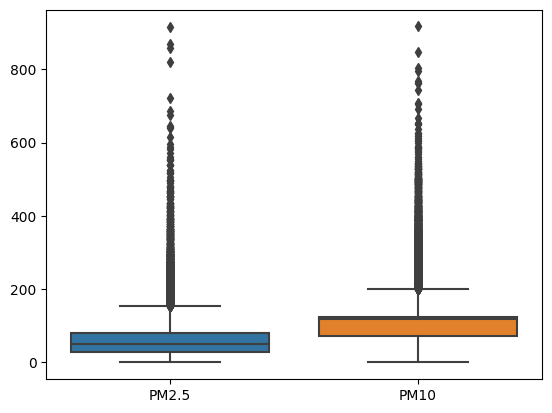

In [33]:
sns.boxplot(data=df1[[ 'PM2.5', 'PM10']])
plt.show()

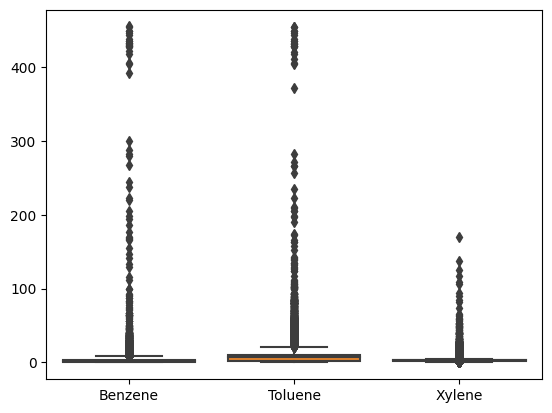

In [34]:
sns.boxplot(data=df1[[ 'Benzene', 'Toluene', 'Xylene']])
plt.show()

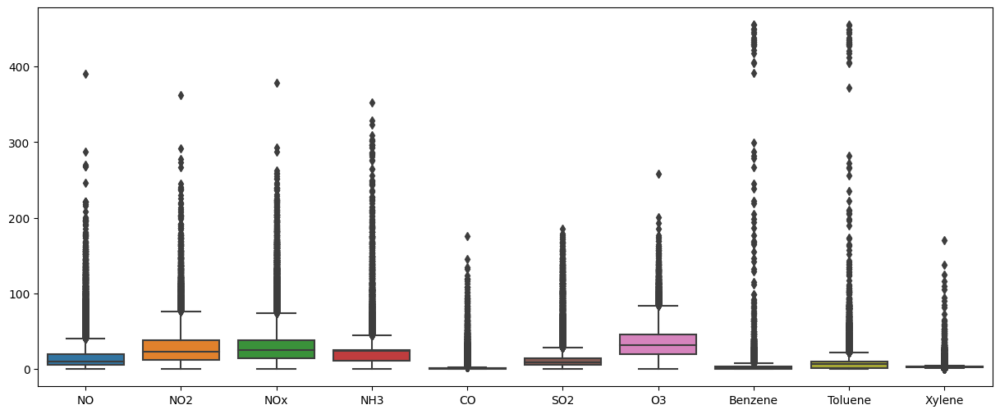

In [35]:
plt.figure(figsize=(15, 6))
sns.boxplot(data=df1[['NO','NO2','NOx','NH3','CO','SO2','O3','Benzene', 'Toluene', 'Xylene']])
plt.show()

In [36]:
def count_outliers_iqr(df):
    outlier_counts = {}
    for column in df.columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
        outlier_counts[column] = len(outliers)

    return outlier_counts


In [37]:
outlier_counts=count_outliers_iqr(df1)

In [38]:
def outlier_percentages(outlier_counts, total_rows):
    outlier_percentages = {}
    for column, count in outlier_counts.items():
        outlier_percentages[column] = (count / total_rows) * 100

    return outlier_percentages

In [39]:
Data=outlier_percentages(outlier_counts,df1.shape[0])

outlier_percentages_df = pd.DataFrame.from_dict(Data, orient='index', columns=['Outliers %'])
outlier_percentages_df['Outliers %']=outlier_percentages_df['Outliers %'].round(2)

In [40]:
outlier_percentages_df.columns

Index(['Outliers %'], dtype='object')

In [ ]:
fig = px.bar(outlier_percentages_df, 
             x=outlier_percentages_df.index,
             y='Outliers %',
             text='Outliers %',
              color='Outliers %',
             title='Percentage of Outliers in Each Column')

fig.update_xaxes(title_text='Column Name')
fig.update_yaxes(title_text='Percentage of Outliers')
fig.update_layout(xaxis_tickangle=45)
fig.update_yaxes(showgrid=True)

fig.show()

In [42]:
def remove_outliers(df):
    df_filtered = df.copy()
    for column in df.select_dtypes(include=np.number).columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1

        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        df_filtered = df_filtered[(df_filtered[column] >= lower_bound) & (df_filtered[column] <= upper_bound)]

    return df_filtered 

In [43]:
df1=remove_outliers(df1)

In [44]:
df1.shape

(11165, 13)

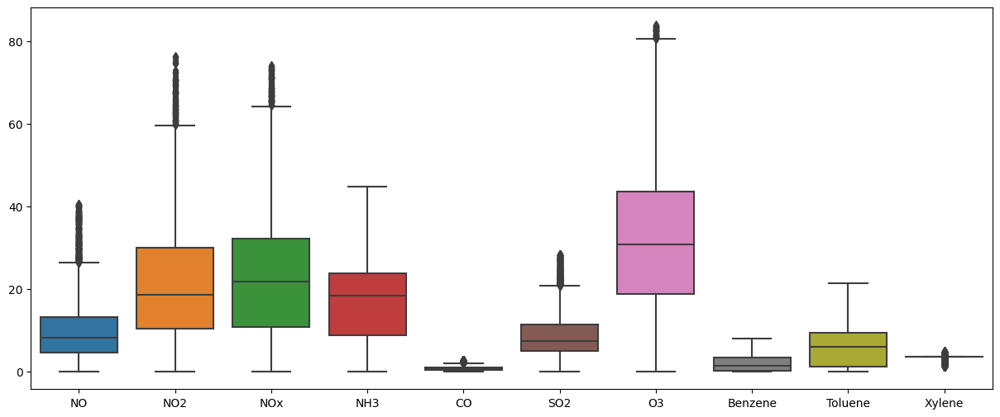

In [45]:
plt.figure(figsize=(15, 6))
sns.boxplot(data=df1[['NO','NO2','NOx','NH3','CO','SO2','O3','Benzene', 'Toluene', 'Xylene']])
plt.show()

In [46]:
count_outliers_iqr(df1)

{'PM2.5': 304,
 'PM10': 0,
 'NO': 502,
 'NO2': 138,
 'NOx': 129,
 'NH3': 0,
 'CO': 639,
 'SO2': 448,
 'O3': 64,
 'Benzene': 0,
 'Toluene': 0,
 'Xylene': 1478,
 'AQI': 692}

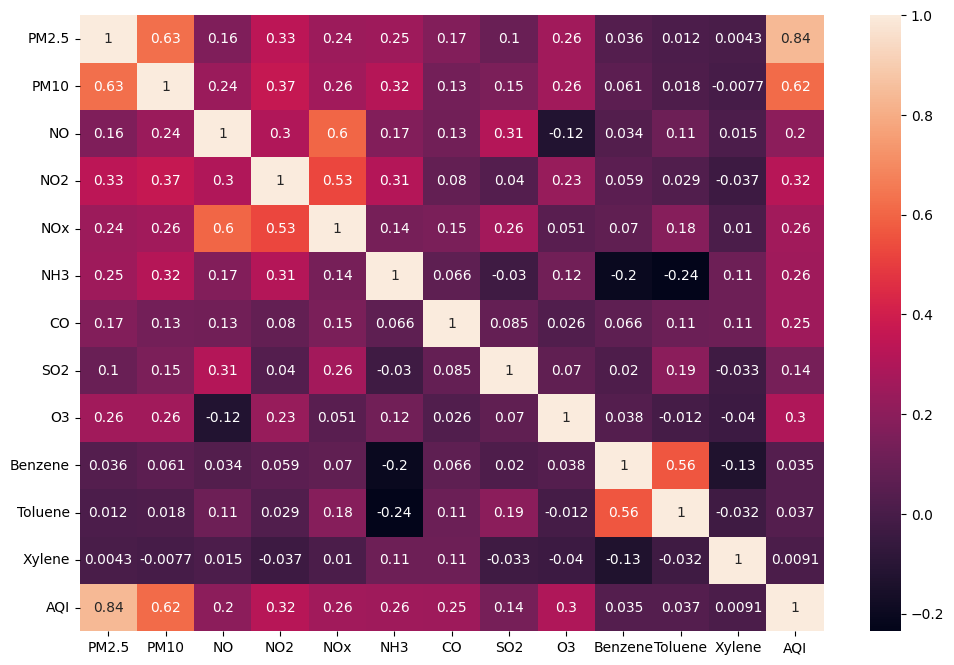

In [47]:
plt.figure(figsize=(12, 8)) 
sns.heatmap(df1.corr(),annot=True) 
plt.show() 

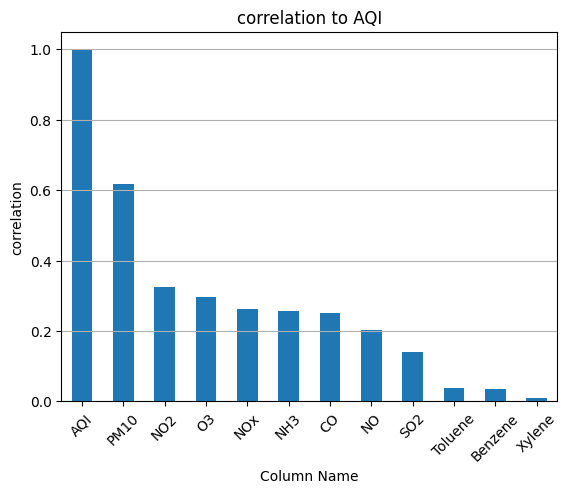

In [48]:
df1[df1.columns[1:]].corr()['AQI'][:].sort_values(ascending=False).plot(kind='bar')
plt.title('correlation to AQI')
plt.xlabel('Column Name')
plt.ylabel('correlation')
plt.xticks(rotation=45)
plt.grid(axis='y')  # Add vertical grid lines
plt.show()

## Scaling the data

In [49]:
from sklearn.preprocessing import StandardScaler
df1 = StandardScaler().fit_transform(df1)

In [50]:
df1

array([[ 4.49197903e-01,  6.72350316e-01, -1.24662317e+00, ...,
         1.96691694e+00, -3.12733608e+00, -3.11513701e-01],
       [ 8.28693892e-01,  6.72350316e-01,  9.91375349e-01, ...,
         8.47607675e-01,  2.76238864e-01,  4.90221144e-01],
       [ 8.28693892e-01,  6.72350316e-01,  9.91375349e-01, ...,
         8.47607675e-01,  2.76238864e-01,  2.28967046e+00],
       ...,
       [-3.83623134e-01, -1.75551516e-03, -1.15879386e+00, ...,
        -5.78448976e-01, -3.66202753e+00, -3.82779021e-01],
       [-1.36214209e+00, -1.43610989e+00, -5.43988657e-01, ...,
        -8.19013193e-02, -3.95907833e+00, -1.07761589e+00],
       [-1.09234468e+00, -6.10921879e-01, -1.26628645e+00, ...,
         8.47607675e-01,  2.76238864e-01, -1.02416690e+00]])

In [51]:
df1 = pd.DataFrame(df1,columns = numeric_cols)
df1

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
0,0.449198,0.672350,-1.246623,-0.965495,-0.970081,0.607964,-0.635041,1.123514,-1.701968,0.559204,1.966917,-3.127336,-0.311514
1,0.828694,0.672350,0.991375,0.524542,0.660520,0.607964,2.539049,1.081813,0.138895,0.939639,0.847608,0.276239,0.490221
2,0.828694,0.672350,0.991375,0.524542,0.660520,0.607964,2.539049,1.081813,0.138895,0.939639,0.847608,0.276239,2.289670
3,0.136936,0.072127,-0.983135,-0.697699,-1.015169,0.607964,2.918704,2.272346,-0.270313,0.939639,0.847608,0.276239,1.238507
4,-0.623402,-0.415450,-0.871710,-0.386711,-0.830719,0.607964,-0.917926,2.003389,0.327871,0.277691,2.646874,-3.860061,-0.364963
...,...,...,...,...,...,...,...,...,...,...,...,...,...
11160,-0.427186,0.421970,-0.587248,1.494336,0.303302,-0.395834,-0.316795,0.944850,0.135313,1.251258,1.007372,-2.236184,-0.222432
11161,-0.711626,-0.185729,-0.956918,0.892516,-0.184464,-0.452214,-0.652721,0.320485,0.615000,0.600258,1.407742,-4.196719,-0.133350
11162,-0.383623,-0.001756,-1.158794,0.121524,-0.649003,-0.321650,-0.617361,0.420383,0.150695,0.664772,-0.578449,-3.662028,-0.382779
11163,-1.362142,-1.436110,-0.543989,0.113606,-0.370963,-0.648061,-0.794164,-0.357672,-0.716388,-0.238417,-0.081901,-3.959078,-1.077616


In [52]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn import metrics
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
from sklearn.metrics import accuracy_score,confusion_matrix
from sklearn.preprocessing import StandardScaler

In [53]:
# Data Preparation for Modeling
x=df1[["PM2.5","PM10","NO","NO2","NOx","NH3","CO","SO2","O3","Benzene","Toluene","Xylene"]]
y=df1["AQI"]

In [54]:
x

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene
0,0.449198,0.672350,-1.246623,-0.965495,-0.970081,0.607964,-0.635041,1.123514,-1.701968,0.559204,1.966917,-3.127336
1,0.828694,0.672350,0.991375,0.524542,0.660520,0.607964,2.539049,1.081813,0.138895,0.939639,0.847608,0.276239
2,0.828694,0.672350,0.991375,0.524542,0.660520,0.607964,2.539049,1.081813,0.138895,0.939639,0.847608,0.276239
3,0.136936,0.072127,-0.983135,-0.697699,-1.015169,0.607964,2.918704,2.272346,-0.270313,0.939639,0.847608,0.276239
4,-0.623402,-0.415450,-0.871710,-0.386711,-0.830719,0.607964,-0.917926,2.003389,0.327871,0.277691,2.646874,-3.860061
...,...,...,...,...,...,...,...,...,...,...,...,...
11160,-0.427186,0.421970,-0.587248,1.494336,0.303302,-0.395834,-0.316795,0.944850,0.135313,1.251258,1.007372,-2.236184
11161,-0.711626,-0.185729,-0.956918,0.892516,-0.184464,-0.452214,-0.652721,0.320485,0.615000,0.600258,1.407742,-4.196719
11162,-0.383623,-0.001756,-1.158794,0.121524,-0.649003,-0.321650,-0.617361,0.420383,0.150695,0.664772,-0.578449,-3.662028
11163,-1.362142,-1.436110,-0.543989,0.113606,-0.370963,-0.648061,-0.794164,-0.357672,-0.716388,-0.238417,-0.081901,-3.959078


In [55]:
y

0       -0.311514
1        0.490221
2        2.289670
3        1.238507
4       -0.364963
           ...   
11160   -0.222432
11161   -0.133350
11162   -0.382779
11163   -1.077616
11164   -1.024167
Name: AQI, Length: 11165, dtype: float64

In [56]:
X_train,X_test,Y_train,Y_test=train_test_split(x,y,test_size=0.2,random_state=43)
print(X_train.shape,X_test.shape,Y_train.shape,Y_test.shape)

(8932, 12) (2233, 12) (8932,) (2233,)


## Model Building

In [57]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.linear_model import BayesianRidge, SGDRegressor
from sklearn.metrics import r2_score
from sklearn.kernel_ridge import KernelRidge
from sklearn.neighbors import KNeighborsRegressor

def evaluate_and_predict_models(X_train, y_train, X_test, y_test, models):

    results = {}
    for model_name, model in zip(map(str, models), models):
        model.fit(X_train, y_train)
        train_preds = model.predict(X_train)
        test_preds = model.predict(X_test)
        train_r2 = r2_score(y_train, train_preds)
        test_r2 = r2_score(y_test, test_preds)
        results[model] = {'train_r2': train_r2, 'test_r2': test_r2}

    return results


models = [
    LinearRegression(),
    Ridge(),
    Lasso(),
    ElasticNet(),
    SVR(),
    DecisionTreeRegressor(),
    RandomForestRegressor(),
    GradientBoostingRegressor(),
    XGBRegressor(),
    BayesianRidge(),
    KernelRidge(),
    SGDRegressor(),
    KNeighborsRegressor()
]

results = evaluate_and_predict_models(X_train, Y_train, X_test,Y_test, models)
d=results

In [58]:
d

{LinearRegression(): {'train_r2': 0.7367465672681996,
  'test_r2': 0.7380491257384046},
 Ridge(): {'train_r2': 0.7367465581483936, 'test_r2': 0.7380515134345348},
 Lasso(): {'train_r2': 0.0, 'test_r2': -6.582767202445439e-05},
 ElasticNet(): {'train_r2': 0.3287457932395379, 'test_r2': 0.3327239488143494},
 SVR(): {'train_r2': 0.8431424103350201, 'test_r2': 0.8239462184856494},
 DecisionTreeRegressor(): {'train_r2': 0.9953842239318733,
  'test_r2': 0.6267381347997226},
 RandomForestRegressor(): {'train_r2': 0.9692719565672351,
  'test_r2': 0.8288522313242968},
 GradientBoostingRegressor(): {'train_r2': 0.8376192433976453,
  'test_r2': 0.822547759619649},
 XGBRegressor(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=

In [59]:
modelss=[
    'Linear Regression',
    'Ridge Regression',
    'Lasso Regression',
    'ElasticNet Regression',
    'SVR',
    'DecisionTree Regressor',
    'RandomForest Regressor',
    'GradientBoosting Regressor',
    'XGB Regressor',
    'BayesianRidge Regression',
    'KernelRidge Regression',
    'SGD Regressor',
    'KNeighbors Regressor']


In [60]:
Train_r2=[]
Test_r2=[]
for i,j in d.items():
    Train_r2.append(j['train_r2'])
    Test_r2.append(j['test_r2'])
print(Train_r2)
print(Test_r2)

[0.7367465672681996, 0.7367465581483936, 0.0, 0.3287457932395379, 0.8431424103350201, 0.9953842239318733, 0.9692719565672351, 0.8376192433976453, 0.9591580423867886, 0.7367462591463739, 0.7367455524782802, 0.7362870647408041, 0.8552386891102928]
[0.7380491257384046, 0.7380515134345348, -6.582767202445439e-05, 0.3327239488143494, 0.8239462184856494, 0.6267381347997226, 0.8288522313242968, 0.822547759619649, 0.816548909292828, 0.7380627536894289, 0.7380607640671633, 0.7373339375783536, 0.7706219223584952]


In [61]:
data={"Models":modelss,
     "Train Score":Train_r2,
     "Test Score":Test_r2}
data

{'Models': ['Linear Regression',
  'Ridge Regression',
  'Lasso Regression',
  'ElasticNet Regression',
  'SVR',
  'DecisionTree Regressor',
  'RandomForest Regressor',
  'GradientBoosting Regressor',
  'XGB Regressor',
  'BayesianRidge Regression',
  'KernelRidge Regression',
  'SGD Regressor',
  'KNeighbors Regressor'],
 'Train Score': [0.7367465672681996,
  0.7367465581483936,
  0.0,
  0.3287457932395379,
  0.8431424103350201,
  0.9953842239318733,
  0.9692719565672351,
  0.8376192433976453,
  0.9591580423867886,
  0.7367462591463739,
  0.7367455524782802,
  0.7362870647408041,
  0.8552386891102928],
 'Test Score': [0.7380491257384046,
  0.7380515134345348,
  -6.582767202445439e-05,
  0.3327239488143494,
  0.8239462184856494,
  0.6267381347997226,
  0.8288522313242968,
  0.822547759619649,
  0.816548909292828,
  0.7380627536894289,
  0.7380607640671633,
  0.7373339375783536,
  0.7706219223584952]}

In [62]:
Models_df=pd.DataFrame(data=data)

In [63]:
Models_df=Models_df.sort_values(by='Test Score',ascending=False).reset_index(drop=True)

In [64]:
Models_df['Test Score']=(Models_df['Test Score']*100).round(2)
Models_df['Train Score']=(Models_df['Train Score']*100).round(2)


In [65]:
Models_df

,Models,Train Score,Test Score
0,RandomForest Regressor,96.93,82.89
1,SVR,84.31,82.39
2,GradientBoosting Regressor,83.76,82.25
3,XGB Regressor,95.92,81.65
4,KNeighbors Regressor,85.52,77.06
5,BayesianRidge Regression,73.67,73.81
6,KernelRidge Regression,73.67,73.81
7,Ridge Regression,73.67,73.81
8,Linear Regression,73.67,73.80
9,SGD Regressor,73.63,73.73


In [66]:
fig = px.bar(Models_df, x='Models', 
             y=['Train Score', 'Test Score'], 
             title='Model Performance (Train & Test Scores)',
             barmode='group')

fig.update_layout(xaxis_title='Model', yaxis_title='Score', legend_title_text='Score Type')
fig.update_traces(marker_line_color='black', marker_line_width=1) 

fig.show()


- above are the scores for respective models when we delete the outliers from our data 

#### Now again calculate the scores of the models , treating outliers (within IQR) 

In [67]:
# This function takes a DataFrame as a parameter and identifies outliers for numeric columns in the DataFrame. 
#It replaces these outliers with the corresponding quartile values ​​(Q1 or Q3). Outliers are identified using the interquartile range (IQR).
def replace_outliers_with_quartiles(df):
    
    for column in df.select_dtypes(include=['number']).columns: # Used to cycle through all numeric columns in the DataFrame.
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        # To identify outliers, lower and upper limits are calculated and values ​​outside these limits are considered outliers.
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        # For each column, we identify outliers and replace them with Q1 or Q3. We do this using a lambda function.
        #If the value is less than the lower bound, it is replaced with Q1. If it is greater than the upper bound, 
        #it is replaced with Q3. In the last case, the value is not changed and remains the same.
        df[column] = df[column].apply(
            lambda x: Q1 if x < lower_bound else (Q3 if x > upper_bound else x)
        )
    
    return df 

df2 = replace_outliers_with_quartiles(df2)

In [68]:
df2

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
28,83.1300,118.454435,6.93,28.71,33.72,23.848366,1.53,14.89,59.7600,0.020000,0.000000,3.140000,209.0
29,79.8400,118.454435,13.85,28.68,41.08,23.848366,1.53,14.89,45.3975,0.040000,0.000000,4.810000,328.0
30,94.5200,118.454435,24.39,32.66,52.61,23.848366,1.53,14.89,45.3975,0.240000,0.010000,3.588683,208.0
31,135.9900,118.454435,19.71,42.08,38.17,23.848366,1.53,14.89,45.3975,0.400000,0.040000,3.588683,208.0
32,79.5075,118.454435,19.71,35.31,72.80,23.848366,1.53,14.89,45.3975,0.460000,0.060000,3.588683,208.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
29526,15.0200,50.940000,7.68,25.06,19.54,12.470000,0.47,8.55,23.3000,2.240000,12.070000,2.650000,41.0
29527,24.3800,74.090000,3.42,26.06,16.53,11.990000,0.52,12.72,30.1400,0.740000,2.210000,2.650000,70.0
29528,22.9100,65.730000,3.45,29.53,18.33,10.710000,0.48,8.42,30.9600,0.010000,0.010000,2.650000,68.0
29529,16.6400,49.970000,4.05,29.26,18.80,10.030000,0.52,9.84,28.3000,0.000000,0.000000,2.650000,54.0


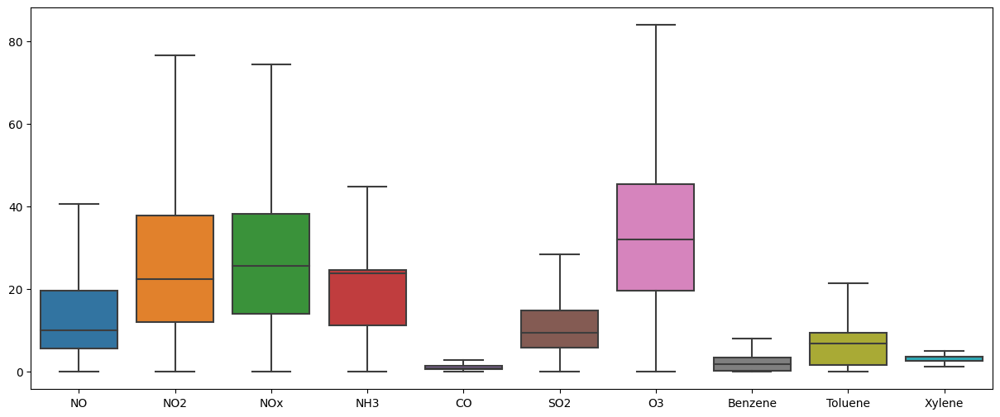

In [69]:
plt.figure(figsize=(15, 6))
sns.boxplot(data=df2[['NO','NO2','NOx','NH3','CO','SO2','O3','Benzene', 'Toluene', 'Xylene']])
plt.show()

In [70]:
from sklearn.preprocessing import StandardScaler
df2 = StandardScaler().fit_transform(df2)
df2 = pd.DataFrame(df2,columns = numeric_cols)
df2

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
0,0.878311,0.437653,-0.636589,0.168508,0.442764,0.452929,0.795376,0.801871,1.520081,-1.136985,-1.325116,-0.294501,0.709998
1,0.774946,0.437653,0.153199,0.166708,0.898821,0.452929,0.795376,0.801871,0.698774,-1.126045,-1.325116,2.695136,2.071243
2,1.236162,0.437653,1.356143,0.405473,1.613267,0.452929,0.795376,0.801871,0.698774,-1.016642,-1.322987,0.508733,0.698559
3,2.539065,0.437653,0.822008,0.970588,0.718505,0.452929,0.795376,0.801871,0.698774,-0.929119,-1.316598,0.508733,0.698559
4,0.764500,0.437653,0.822008,0.564449,2.864324,0.452929,0.795376,0.801871,0.698774,-0.896298,-1.312339,0.508733,0.698559
...,...,...,...,...,...,...,...,...,...,...,...,...,...
24845,-1.261565,-1.289981,-0.550991,-0.050459,-0.435888,-0.728604,-0.927014,-0.314172,-0.564852,0.077392,1.245171,-1.171699,-1.211760
24846,-0.967493,-0.697593,-1.037190,0.009532,-0.622400,-0.778447,-0.845770,0.419882,-0.173713,-0.743133,-0.854500,-1.171699,-0.880028
24847,-1.013678,-0.911518,-1.033766,0.217701,-0.510864,-0.911363,-0.910766,-0.337056,-0.126822,-1.142455,-1.322987,-1.171699,-0.902906
24848,-1.210668,-1.314802,-0.965288,0.201503,-0.481741,-0.981974,-0.845770,-0.087091,-0.278932,-1.147926,-1.325116,-1.171699,-1.063053


In [71]:
# Data Preparation for Modeling
x=df2[["PM2.5","PM10","NO","NO2","NOx","NH3","CO","SO2","O3","Benzene","Toluene","Xylene"]]
y=df2["AQI"]
X_train,X_test,Y_train,Y_test=train_test_split(x,y,test_size=0.2,random_state=43)
print(X_train.shape,X_test.shape,Y_train.shape,Y_test.shape)

(19880, 12) (4970, 12) (19880,) (4970,)


In [72]:
results = evaluate_and_predict_models(X_train, Y_train, X_test,Y_test, models)
d2=results

In [73]:
d2

{LinearRegression(): {'train_r2': 0.6532012740504637,
  'test_r2': 0.6477247579823091},
 Ridge(): {'train_r2': 0.6532012726542932, 'test_r2': 0.6477252606753989},
 Lasso(): {'train_r2': 0.0, 'test_r2': -1.5010574972551538e-05},
 ElasticNet(): {'train_r2': 0.23867944952561448,
  'test_r2': 0.2338199584897741},
 SVR(): {'train_r2': 0.7702192924567463, 'test_r2': 0.7277075317721937},
 DecisionTreeRegressor(): {'train_r2': 0.9993894048810585,
  'test_r2': 0.6870136833264544},
 RandomForestRegressor(): {'train_r2': 0.978019127335832,
  'test_r2': 0.842499482871042},
 GradientBoostingRegressor(): {'train_r2': 0.8326283105417904,
  'test_r2': 0.8201992049104496},
 XGBRegressor(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_ty

In [74]:
Train_r2=[]
Test_r2=[]
for i,j in d2.items():
    Train_r2.append(j['train_r2'])
    Test_r2.append(j['test_r2'])
    
data={"Models":modelss,
     "Train Score":Train_r2,
     "Test Score":Test_r2}

Models_df=pd.DataFrame(data=data)
Models_df=Models_df.sort_values(by='Test Score',ascending=False).reset_index(drop=True)
Models_df['Test Score']=(Models_df['Test Score']*100).round(2)
Models_df['Train Score']=(Models_df['Train Score']*100).round(2)
Models_df

,Models,Train Score,Test Score
0,RandomForest Regressor,97.80,84.25
1,XGB Regressor,93.07,83.52
2,GradientBoosting Regressor,83.26,82.02
3,KNeighbors Regressor,84.99,76.60
4,SVR,77.02,72.77
5,DecisionTree Regressor,99.94,68.70
6,KernelRidge Regression,65.32,64.79
7,BayesianRidge Regression,65.32,64.77
8,Ridge Regression,65.32,64.77
9,Linear Regression,65.32,64.77


In [75]:
fig = px.bar(Models_df, x='Models', 
             y=['Train Score', 'Test Score'], 
             title='Model Performance (Train & Test Scores)',
             barmode='group')

fig.update_layout(xaxis_title='Model', yaxis_title='Score', legend_title_text='Score Type')
fig.update_traces(marker_line_color='black', marker_line_width=1) 

fig.show()


- their is no huge difference in the model scores 

- on observation only 1% change in the top score model(random forest)

- now we use RandomForest regressor and apply hyperparameter tuning

## Hyper Parameter Tunning

## below  cell may take more time to execute

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

rf_model = RandomForestRegressor()
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, Y_train)


In [ ]:
grid_search.best_score_

In [ ]:
pd.DataFrame(grid_search.cv_results_)

In [ ]:
grid_search.best_params_

In [76]:
rf=RandomForestRegressor(max_depth=None,min_samples_leaf=2,min_samples_split=2,n_estimators=300)

In [77]:
rf.fit(X_train,Y_train)

RandomForestRegressor(min_samples_leaf=2, n_estimators=300)

In [78]:
#predicting train
train_preds1=rf.predict(X_train)
#predicting on test
test_preds1=rf.predict(X_test)

In [79]:
RMSE_train=(np.sqrt(metrics.mean_squared_error(Y_train,train_preds1)))
RMSE_test=(np.sqrt(metrics.mean_squared_error(Y_test,test_preds1)))
print("RMSE TrainingData = ",str(RMSE_train))
print("RMSE TestData = ",str(RMSE_test))
print('-'*50)
print('RSquared value on train:',rf.score(X_train, Y_train))
print('RSquared value on test:',rf.score(X_test, Y_test))

RMSE TrainingData =  0.18578167725155603
RMSE TestData =  0.3961971711715269
--------------------------------------------------
RSquared value on train: 0.965392985894969
RSquared value on test: 0.8446808078838945


In [80]:
r2_score(Y_test,test_preds1)

0.8446808078838945

## Observations :

- there is no huge difference considering or removing outliers in the data set 
- on training various regression models finding that random forest regeressor gives best score 
- after hpyerparameter tunning
"
{'max_depth': None,
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'n_estimators': 300}"  
 - these are the best parameter that i found 
 